In [1]:
import pandas as pd
import numpy as np
import stanza
from tqdm import tqdm
from collections import Counter
import math
from scipy.stats import binom_test

tqdm.pandas()
nlp = stanza.Pipeline(lang='en', processors='tokenize,mwt,pos,lemma')

pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

2020-08-13 17:20:18 WARNING: Can not find mwt: default from official model list. Ignoring it.
2020-08-13 17:20:18 INFO: Loading these models for language: en (English):
| Processor | Package |
-----------------------
| tokenize  | ewt     |
| pos       | ewt     |
| lemma     | ewt     |

2020-08-13 17:20:18 INFO: Use device: cpu
2020-08-13 17:20:18 INFO: Loading: tokenize
2020-08-13 17:20:18 INFO: Loading: pos
2020-08-13 17:20:19 INFO: Loading: lemma
2020-08-13 17:20:19 INFO: Done loading processors!


## AskParents

In [2]:
train = pd.read_csv('../../annotated_data/askparents_train.tsv', sep='\t', header=0)
train['Sentence'] = train['Sentence'].apply(lambda x: x.lower())
train_sentences = train['Sentence'].tolist()
train_labels_DS = train['DS_Label'].values
train_labels_Maj = train['Majority_label'].values

train['Post.ID'] = train['ID'].apply(lambda x: x.split('-')[0])
train['Post-Reply.ID'] = train['ID'].apply(lambda x: x.split('-')[0]+x.split('-')[1])
train['Reply.ID'] = train['ID'].apply(lambda x: x.split('-')[1])
train['Sent.Num'] = train['ID'].apply(lambda x: x.split('-')[2])
train

,ID,Majority_label,DS_Label,Sentence,Post.ID,Post-Reply.ID,Reply.ID,Sent.Num
0,conux0-4-0,0,0,why does it bother your gf when you only have him every other weekend ?,conux0,conux04,4,0
1,c7yyzm-2.1-1,1,1,i 'd be in the room but doing something else and ignoring him .,c7yyzm,c7yyzm2.1,2.1,1
2,30twyy-1-7,0,0,rapid fire one after the other .,30twyy,30twyy1,1,7
3,aai1qa-2-0,0,0,ianal but at least in my state ( mo ) you can move out at 17 but can not legally be kicked out until you 're 18 .,aai1qa,aai1qa2,2,0
4,bi3si0-5-3,0,0,sounds like you are with grandparents who love and want you .,bi3si0,bi3si05,5,3
5,cfydns-5-1,1,1,try to figure out why he thought he had to go to a prostitute .,cfydns,cfydns5,5,1
6,d7znnn-1-5,0,0,"plus , it does nt cost anything .",d7znnn,d7znnn1,1,5
7,cz622t-11-0,0,0,i did exactly the same thing .,cz622t,cz622t11,11,0
8,8y4dq0-1-1,1,1,if you want her to act a certain way model the behavior and provide alternatives .,8y4dq0,8y4dq01,1,1
9,d7znaj-4-0,0,0,if you 're in the us they type at birth .,d7znaj,d7znaj4,4,0


In [3]:
train_text = " ".join(sent for sent in train_sentences)
doc = nlp(train_text)
train_lemmas = [word.lemma for sent in doc.sentences for word in sent.words]

In [4]:
advice_sentences = train[train['DS_Label']==1]['Sentence'].tolist()
advice_text = " ".join(sent for sent in advice_sentences)
doc_advice = nlp(advice_text)
advice_lemmas = [word.lemma for sent in doc_advice.sentences for word in sent.words]
advice_count = Counter(advice_lemmas)

In [5]:
logoddsdf = pd.DataFrame.from_dict(Counter(train_lemmas), orient='index').reset_index()
logoddsdf = logoddsdf.rename(columns={'index':'lemma',0:'total_count'})
logoddsdf

,lemma,total_count
0,why,122
1,do,1816
2,it,2344
3,bother,13
4,you,3520
5,gf,6
6,when,567
7,only,191
8,have,2023
9,he,1459


In [9]:
logoddsdf.loc[:, 'advice_count'] = logoddsdf['lemma'].apply(lambda x: advice_count[x] if x in advice_count.keys() else 0)
logoddsdf.loc[:, 'nonadvice_count'] = logoddsdf.apply(lambda x: x['total_count'] - x['advice_count'], axis=1)

num_advice = len(train[train['DS_Label']==1])
num_nonadvice = len(train[train['DS_Label']==0])

logoddsdf = logoddsdf[(logoddsdf['advice_count']>0) & ((logoddsdf['nonadvice_count']>0))]

logoddsdf.loc[:, 'logodds'] = logoddsdf.apply(lambda x: math.log((x['advice_count']*num_nonadvice)/(x['nonadvice_count']*num_advice)), axis=1)

/Users/venkat/opt/miniconda3/envs/advice/lib/python3.6/site-packages/pandas/core/indexing.py:966: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


In [10]:
logoddsdf.loc[:, 'p-value'] = logoddsdf.apply(lambda y: binom_test(x=y['advice_count'], n=y['total_count'],
                                                                   p=0.5), axis=1)

/Users/venkat/opt/miniconda3/envs/advice/lib/python3.6/site-packages/pandas/core/indexing.py:845: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = _infer_fill_value(value)


In [11]:
logoddsdf

,lemma,total_count,advice_count,nonadvice_count,logodds,p-value
0,why,122.0,30,92.0,-0.209925,1.646722e-08
1,do,1816.0,536,1280.0,0.040185,4.686521e-70
2,it,2344.0,693,1651.0,0.042560,1.702638e-89
3,bother,13.0,3,10.0,-0.293307,9.228516e-02
4,you,3520.0,1470,2050.0,0.578089,1.358205e-22
5,gf,6.0,3,3.0,0.910666,1.000000e+00
6,when,567.0,139,428.0,-0.213983,3.318519e-35
7,only,191.0,42,149.0,-0.355611,3.044367e-15
8,have,2023.0,493,1530.0,-0.221848,4.777222e-123
9,he,1459.0,393,1066.0,-0.087193,6.922155e-72


In [12]:
logoddsdf = logoddsdf[logoddsdf['p-value']<0.05].sort_values(by=['logodds'])

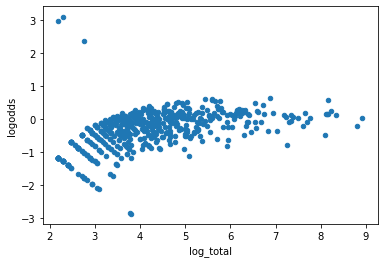

In [13]:
logoddsdf['log_total'] = logoddsdf['total_count'].apply(lambda x: math.log(x))
logoddsdf.plot(x='log_total', y='logodds', kind='scatter')

In [14]:
logoddsdf[logoddsdf['logodds']>0].sort_values(by=['logodds'], ascending=False).head(50)

,lemma,total_count,advice_count,nonadvice_count,logodds,p-value,log_total
146,outfit,10.0,9,1.0,3.107891,2.148437e-02,2.302585
708,library,9.0,8,1.0,2.990108,3.906250e-02,2.197225
541,encourage,16.0,13,3.0,2.377003,2.127075e-02,2.772589
68,if,975.0,422,553.0,0.640313,3.056952e-05,6.882437
21,something,229.0,97,132.0,0.602575,2.444155e-02,5.433722
183,take,268.0,113,155.0,0.594629,1.212064e-02,5.590987
118,help,269.0,113,156.0,0.588198,1.031071e-02,5.594711
4,you,3520.0,1470,2050.0,0.578089,1.358205e-22,8.166216
117,need,323.0,133,190.0,0.553991,1.790174e-03,5.777652
502,then,287.0,117,170.0,0.537041,2.090549e-03,5.659482


In [15]:
logoddsdf[logoddsdf['logodds']<0].sort_values(by=['logodds']).head(50)

,lemma,total_count,advice_count,nonadvice_count,logodds,p-value,log_total
208,luck,45.0,1,44.0,-2.873524,2.614797e-12,3.806662
209,sorry,44.0,1,43.0,-2.850534,5.115908e-12,3.784190
166,crazy,22.0,1,21.0,-2.133856,1.096725e-05,3.091042
679,dog,21.0,1,20.0,-2.085066,2.098083e-05,3.044522
322,quite,19.0,1,18.0,-1.979706,7.629395e-05,2.944439
897,snack,19.0,1,18.0,-1.979706,7.629395e-05,2.944439
1946,teens,19.0,1,18.0,-1.979706,7.629395e-05,2.944439
733,travel,17.0,1,16.0,-1.861923,2.746582e-04,2.833213
185,horrible,16.0,1,15.0,-1.797384,5.187988e-04,2.772589
2479,>,16.0,1,15.0,-1.797384,5.187988e-04,2.772589


# Needadvice

In [16]:
train_na = pd.read_csv('../../annotated_data/needadvice_train.tsv', sep='\t', header=0)
train_na['Sentence'] = train_na['Sentence'].apply(lambda x: x.lower())
na_sentences = train_na['Sentence'].tolist()

In [17]:
na_text = " ".join(sent for sent in na_sentences)
docna = nlp(na_text)
na_lemmas = [word.lemma for sent in docna.sentences for word in sent.words]

In [18]:
advice_sentences = train_na[train_na['DS_Label']==1]['Sentence'].tolist()
advice_text = " ".join(sent for sent in advice_sentences)
docna_advice = nlp(advice_text)
advice_lemmas = [word.lemma for sent in docna_advice.sentences for word in sent.words]
advice_count = Counter(advice_lemmas)

In [19]:
logoddsdfna = pd.DataFrame.from_dict(Counter(na_lemmas), orient='index').reset_index()
logoddsdfna = logoddsdfna.rename(columns={'index':'lemma',0:'total_count'})

logoddsdfna.loc[:, 'advice_count'] = logoddsdfna['lemma'].apply(lambda x: advice_count[x] if x in advice_count.keys() else 0)
logoddsdfna.loc[:, 'nonadvice_count'] = logoddsdfna.apply(lambda x: x['total_count'] - x['advice_count'], axis=1)

num_advice = len(train_na[train_na['DS_Label']==1])
num_nonadvice = len(train_na[train_na['DS_Label']==0])

logoddsdfna = logoddsdfna[(logoddsdfna['advice_count']>0) & ((logoddsdfna['nonadvice_count']>0))]

logoddsdfna.loc[:, 'logodds'] = logoddsdfna.apply(lambda x: math.log((x['advice_count']*num_nonadvice)/(x['nonadvice_count']*num_advice)), axis=1)

In [20]:
logoddsdfna.loc[:, 'p-value'] = logoddsdfna.apply(lambda y: binom_test(x=y['advice_count'], n=y['total_count'],
                                                                   p=0.5), axis=1)
logoddsdfna = logoddsdfna[logoddsdfna['p-value']<0.05].sort_values(by=['logodds'])

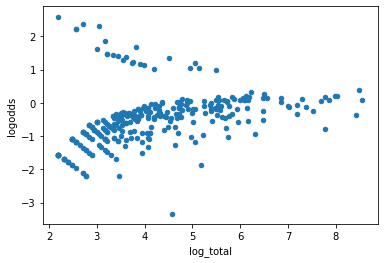

In [21]:
logoddsdfna['log_total'] = logoddsdfna['total_count'].apply(lambda x: math.log(x))
logoddsdfna.plot(x='log_total', y='logodds', kind='scatter')

In [22]:
logoddsdfna[logoddsdfna['logodds']>0].sort_values(by=['logodds'], ascending=False).head(50)

,lemma,total_count,advice_count,nonadvice_count,logodds,p-value,log_total
1599,minor,9,8,1,2.596170,3.906250e-02,2.197225
1141,professor,15,13,2,2.388531,7.385254e-03,2.708050
700,meditation,21,18,3,2.308488,1.489639e-03,3.044522
714,prepare,13,11,2,2.221477,2.246094e-02,2.564949
111,breath,13,11,2,2.221477,2.246094e-02,2.564949
99,phone,24,19,5,1.851730,6.610751e-03,3.178054
155,recommend,46,35,11,1.674182,5.355851e-04,3.828641
470,resource,20,15,5,1.615341,4.138947e-02,2.995732
1049,straight,25,18,7,1.461191,4.328525e-02,3.218876
504,please,25,18,7,1.461191,4.328525e-02,3.218876


In [23]:
logoddsdfna[logoddsdfna['logodds']<0].sort_values(by=['logodds']).head(50)

,lemma,total_count,advice_count,nonadvice_count,logodds,p-value,log_total
75,luck,96,2,94,-3.333419,1.175592e-25,4.564348
1187,thanks,16,1,15,-2.191321,5.187988e-04,2.772589
1499,:),32,2,30,-2.191321,2.463348e-07,3.465736
526,almost,16,1,15,-2.191321,5.187988e-04,2.772589
434,mine,15,1,14,-2.122328,9.765625e-04,2.708050
1603,>,15,1,14,-2.122328,9.765625e-04,2.708050
1814,18,13,1,12,-1.968178,3.417969e-03,2.564949
343,lol,12,1,11,-1.881166,6.347656e-03,2.484907
1099,fight,12,1,11,-1.881166,6.347656e-03,2.484907
377,we,176,15,161,-1.856625,4.584560e-32,5.170484
